# Modeling

Two models built to serve operators with different response times:

#### 1-Hour Model
Real-time dispatch decisions. Primary use:
- Battery operators: energy arbitrage (charge/discharge)
- BTC miners: real-time curtailment when grid stress detected

#### 24-Hour Model
Day-ahead planning. Primary use:
- Datacenters: AI workload scheduling, cooling, backup power, SLA management
- Battery operators: DAM bidding, ancillary service commitments (Reg up/down, ECRS)
- BTC miners: crew scheduling, cooling, maintenance windows

In [1]:
import pandas as pd
import numpy as np
import os

PROJECT_PATH = '/Users/kamilmadey/Desktop/ercot_forecasting_project/'
processed_path = os.path.join(PROJECT_PATH, 'data', 'processed')

df = pd.read_parquet(processed_path + '/model_ready.parquet')

In [2]:
# Train / test split - (train 2021-2024 | test on 2025) 

train = df[df['timestamp'] < '2025-01-01']
test = df[df['timestamp'] >= '2025-01-01']

# Need to drop RT related price cols to prevent data leakage, regime col is target col
drop_cols = ['timestamp', 'RT_price', 'RT_DAM_spread', 'RT_price_ramp', 'regime']

X_train = train.drop(columns=drop_cols)

y_train = train['regime']

X_test = test.drop(columns=drop_cols)
y_test = test['regime']

In [3]:
# Model comparisons - Default models

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
from sklearn.metrics import classification_report, confusion_matrix


models = {'Logistic Regression': LogisticRegression(max_iter=1000),
          'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
          'Light GBM':lgb.LGBMClassifier(n_estimators=100, random_state=42)}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"----{name}----")
    print(classification_report(y_test, y_pred))

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


----Logistic Regression----
              precision    recall  f1-score   support

         Low       0.39      0.89      0.54       644
      Normal       0.92      0.88      0.90      7559
    Scarcity       0.75      0.06      0.11        50
       Tight       0.32      0.02      0.04       505

    accuracy                           0.83      8758
   macro avg       0.59      0.46      0.40      8758
weighted avg       0.84      0.83      0.82      8758

----Random Forest----
              precision    recall  f1-score   support

         Low       0.86      0.77      0.81       644
      Normal       0.93      0.99      0.96      7559
    Scarcity       0.60      0.06      0.11        50
       Tight       0.74      0.27      0.39       505

    accuracy                           0.92      8758
   macro avg       0.78      0.52      0.57      8758
weighted avg       0.92      0.92      0.91      8758

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testin

## Light GBM wins in terms of F1 score, Scarcity Recall and Tight Recall

- Scarcity is only .26 -- means class imbalance, not enough scarcity events to learn from. Can tune this in cross validation to value scarcity events more

In [4]:
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
lgb.log_to_file = None
import warnings
warnings.filterwarnings('ignore')

param_grid = {'n_estimators': [100,300],
            'max_depth': [3,5,-1],
            'learning_rate': [0.01, 0.05, 0.1],
            'num_leaves': [31,63]}

lgbm = lgb.LGBMClassifier(class_weight='balanced', random_state=42)
tscv = TimeSeriesSplit(n_splits=3)

grid = GridSearchCV(estimator=lgbm, param_grid=param_grid, cv=tscv, scoring='f1_weighted', n_jobs=-1,verbose=1)

grid.fit(X_train,y_train)
print('Best params:', grid.best_params_)
print(classification_report(y_test, grid.best_estimator_.predict(X_test)))

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13812
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13812
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13812
[LightGBM] [Info] Number of data points in the train set: 8716, number of used features: 62
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045243 seconds.
You can set `force_row_

In [5]:
print('Best params:', grid.best_params_)
print(classification_report(y_test, grid.best_estimator_.predict(X_test)))

Best params: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 300, 'num_leaves': 31}
              precision    recall  f1-score   support

         Low       0.74      0.88      0.81       644
      Normal       0.98      0.92      0.95      7559
    Scarcity       0.30      0.28      0.29        50
       Tight       0.49      0.80      0.61       505

    accuracy                           0.91      8758
   macro avg       0.63      0.72      0.66      8758
weighted avg       0.93      0.91      0.92      8758



Text(0.5, 1.0, 'Top 20 Feature Importances')

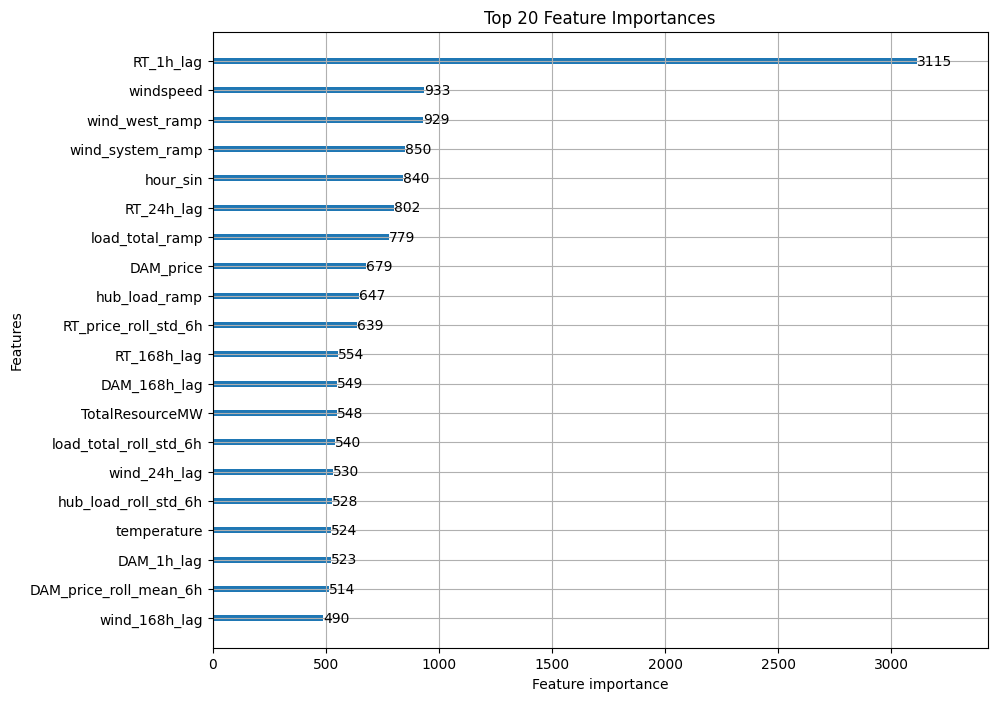

In [6]:
import matplotlib.pyplot as plt
# Feature importance
lgb.plot_importance(grid.best_estimator_, max_num_features=20, figsize=(10,8))
plt.title('Top 20 Feature Importances')

In [7]:
# Slower model to see if score improves

lgbm_slow = lgb.LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.01,
    max_depth=-1,
    num_leaves=63,
    class_weight='balanced',
    random_state=42,
    verbose=0
)
lgbm_slow.fit(X_train, y_train)
print(classification_report(y_test, lgbm_slow.predict(X_test)))

              precision    recall  f1-score   support

         Low       0.79      0.86      0.82       644
      Normal       0.97      0.95      0.96      7559
    Scarcity       0.36      0.30      0.33        50
       Tight       0.57      0.67      0.62       505

    accuracy                           0.92      8758
   macro avg       0.67      0.69      0.68      8758
weighted avg       0.93      0.92      0.93      8758



## 24 hour model

In [8]:
drop_24h = ['timestamp', 'RT_price', 'RT_DAM_spread', 'RT_price_ramp', 'regime',
    'RT_1h_lag', 'DAM_1h_lag',
    'RT_price_roll_mean_6h', 'RT_price_roll_std_6h',
    'DAM_price_roll_mean_6h', 'DAM_price_roll_std_6h',
    'hub_load_roll_mean_6h', 'hub_load_roll_std_6h',
    'load_total_roll_mean_6h', 'load_total_roll_std_6h',
    'WGRPP_LZ_WEST_roll_mean_6h', 'WGRPP_LZ_WEST_roll_std_6h',
    'load_total_ramp', 'hub_load_ramp',
    'wind_west_ramp', 'wind_system_ramp',
    'hub_load', 'load_total',
    'WGRPP_LZ_WEST', 'WGRPP_SYSTEM_WIDE',
    'PVGRPP_SYSTEM_WIDE',
    'net_load_system', 'net_load_west',
    'renewable_pct_system', 'renewable_pct_west'
]

X_train_24h = train.drop(columns=drop_24h)
y_train_24h = train['regime']
X_test_24h = test.drop(columns=drop_24h)
y_test_24h = test['regime']

print('24h features:', X_train_24h.columns.tolist())
print('Feature count:', X_train_24h.shape[1])

24h features: ['DAM_price', 'temperature', 'humidity', 'windspeed', 'precipitation', 'TotalResourceMWZoneWest', 'TotalResourceMW', 'STPPF_SYSTEM_WIDE', 'COP_HSL_SYSTEM_WIDE', 'STWPF_LZ_WEST', 'COP_HSL_LZ_WEST', 'West', 'SystemTotal', 'hour', 'day_of_week', 'month', 'is_weekend', 'hour_sin', 'hour_cos', 'RT_24h_lag', 'RT_168h_lag', 'DAM_24h_lag', 'DAM_168h_lag', 'hub_load_24h_lag', 'load_total_24h_lag', 'wind_24h_lag', 'wind_168h_lag', 'RT_price_roll_mean_24h', 'RT_price_roll_std_24h', 'DAM_price_roll_mean_24h', 'DAM_price_roll_std_24h', 'hub_load_roll_mean_24h', 'hub_load_roll_std_24h', 'load_total_roll_mean_24h', 'load_total_roll_std_24h', 'WGRPP_LZ_WEST_roll_mean_24h', 'WGRPP_LZ_WEST_roll_std_24h']
Feature count: 37


In [9]:
models_24h = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'LightGBM': lgb.LGBMClassifier(n_estimators=100, random_state=42, verbose=0)
}

for name, model in models_24h.items():
    model.fit(X_train_24h, y_train_24h)
    y_pred = model.predict(X_test_24h)
    print(f'\n----{name}----')
    print(classification_report(y_test_24h, y_pred))


----Logistic Regression----
              precision    recall  f1-score   support

         Low       0.67      0.60      0.63       644
      Normal       0.90      0.98      0.94      7559
    Scarcity       0.00      0.00      0.00        50
       Tight       0.50      0.00      0.00       505

    accuracy                           0.89      8758
   macro avg       0.52      0.39      0.39      8758
weighted avg       0.86      0.89      0.85      8758


----Random Forest----
              precision    recall  f1-score   support

         Low       0.68      0.63      0.65       644
      Normal       0.91      0.97      0.94      7559
    Scarcity       0.00      0.00      0.00        50
       Tight       0.65      0.10      0.17       505

    accuracy                           0.89      8758
   macro avg       0.56      0.42      0.44      8758
weighted avg       0.87      0.89      0.87      8758


----LightGBM----
              precision    recall  f1-score   support

     

In [10]:
param_grid_24h = {
    'n_estimators': [100, 300],
    'max_depth': [3, 5, -1],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63]
}

lgbm_24h = lgb.LGBMClassifier(class_weight='balanced', random_state=42, verbose=0)
tscv = TimeSeriesSplit(n_splits=3)

grid_24h = GridSearchCV(
    lgbm_24h,
    param_grid_24h,
    cv=tscv,
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

grid_24h.fit(X_train_24h, y_train_24h)
print('Best params:', grid_24h.best_params_)
print(classification_report(y_test_24h, grid_24h.best_estimator_.predict(X_test_24h)))

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

In [11]:
print('Best params:', grid_24h.best_params_)
print(classification_report(y_test_24h, grid_24h.best_estimator_.predict(X_test_24h)))

Best params: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 300, 'num_leaves': 63}
              precision    recall  f1-score   support

         Low       0.52      0.76      0.62       644
      Normal       0.96      0.87      0.91      7559
    Scarcity       0.30      0.20      0.24        50
       Tight       0.38      0.67      0.48       505

    accuracy                           0.85      8758
   macro avg       0.54      0.63      0.56      8758
weighted avg       0.89      0.85      0.86      8758



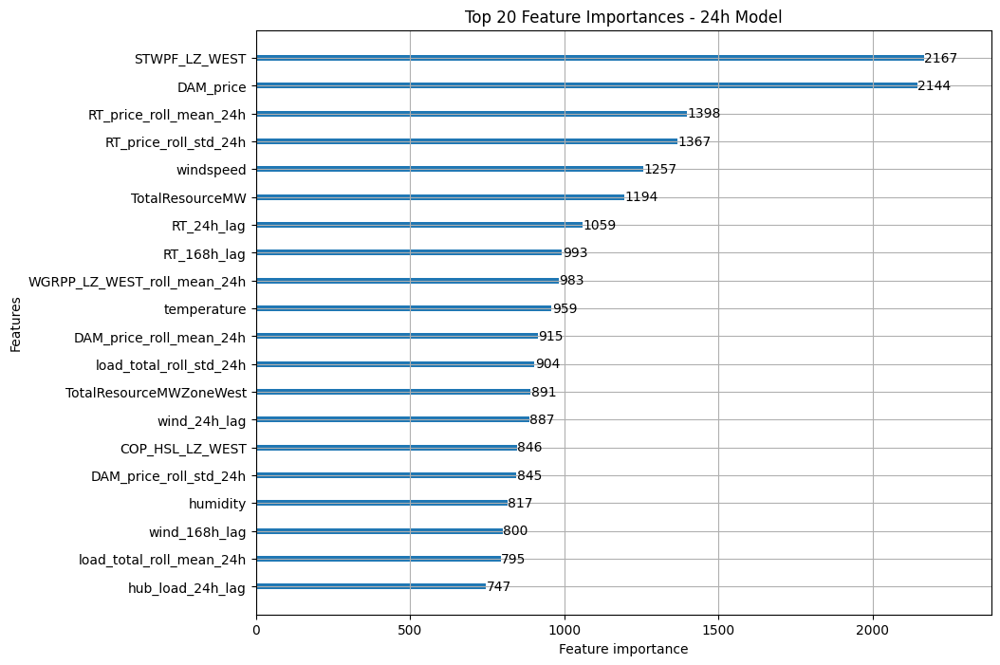

In [31]:
# Feature importance

fig, ax = plt.subplots(figsize=(10, 8))
fig.patch.set_facecolor('white')
lgb.plot_importance(grid_24h.best_estimator_, max_num_features=20, ax=ax)
ax.set_title('Top 20 Feature Importances - 24h Model')
plt.savefig(PROJECT_PATH + 'images/feature_importance_24h.png', bbox_inches='tight', dpi=150, facecolor='white')

### Custom Weight experiment

Custom weights (Scarcity: 50x) boosted scarcity recall to 0.46 but crashed Tight recall to 0.41. Tradeoff not worth it.

In [13]:
lgbm_custom = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=5,
    num_leaves=31,
    class_weight={'Low': 1, 'Normal': 1, 'Tight': 5, 'Scarcity': 50},
    random_state=42,
    verbose=0
)
tscv = TimeSeriesSplit(n_splits=3)

grid_24h_custom = GridSearchCV(
    lgbm_custom,
    param_grid_24h,
    cv=tscv,
    scoring='f1_weighted',
    n_jobs=-1,
    verbose=1
)

grid_24h_custom.fit(X_train_24h, y_train_24h)
print('Best params:', grid_24h_custom.best_params_)
print(classification_report(y_test_24h, grid_24h_custom.best_estimator_.predict(X_test_24h)))

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

In [14]:
print('Best params:', grid_24h_custom.best_params_)
print(classification_report(y_test_24h, grid_24h_custom.best_estimator_.predict(X_test_24h)))

Best params: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 300, 'num_leaves': 31}
              precision    recall  f1-score   support

         Low       0.72      0.63      0.67       644
      Normal       0.94      0.93      0.94      7559
    Scarcity       0.11      0.46      0.17        50
       Tight       0.40      0.41      0.41       505

    accuracy                           0.88      8758
   macro avg       0.54      0.61      0.55      8758
weighted avg       0.89      0.88      0.88      8758



## Test without Uri

In [15]:
train_no_uri = train[~((train['timestamp'].dt.year == 2021) & (train['timestamp'].dt.month == 2))]

X_train_no_uri = train_no_uri.drop(columns=drop_cols)
y_train_no_uri = train_no_uri['regime']

lgbm_no_uri = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=5,
    num_leaves=31,
    class_weight='balanced',
    random_state=42,
    verbose=0
)
lgbm_no_uri.fit(X_train_no_uri, y_train_no_uri)
print(classification_report(y_test, lgbm_no_uri.predict(X_test)))

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [16]:
print(classification_report(y_test, lgbm_no_uri.predict(X_test)))

              precision    recall  f1-score   support

         Low       0.74      0.89      0.81       644
      Normal       0.98      0.92      0.95      7559
    Scarcity       0.31      0.32      0.31        50
       Tight       0.47      0.78      0.59       505

    accuracy                           0.90      8758
   macro avg       0.62      0.73      0.66      8758
weighted avg       0.93      0.90      0.91      8758



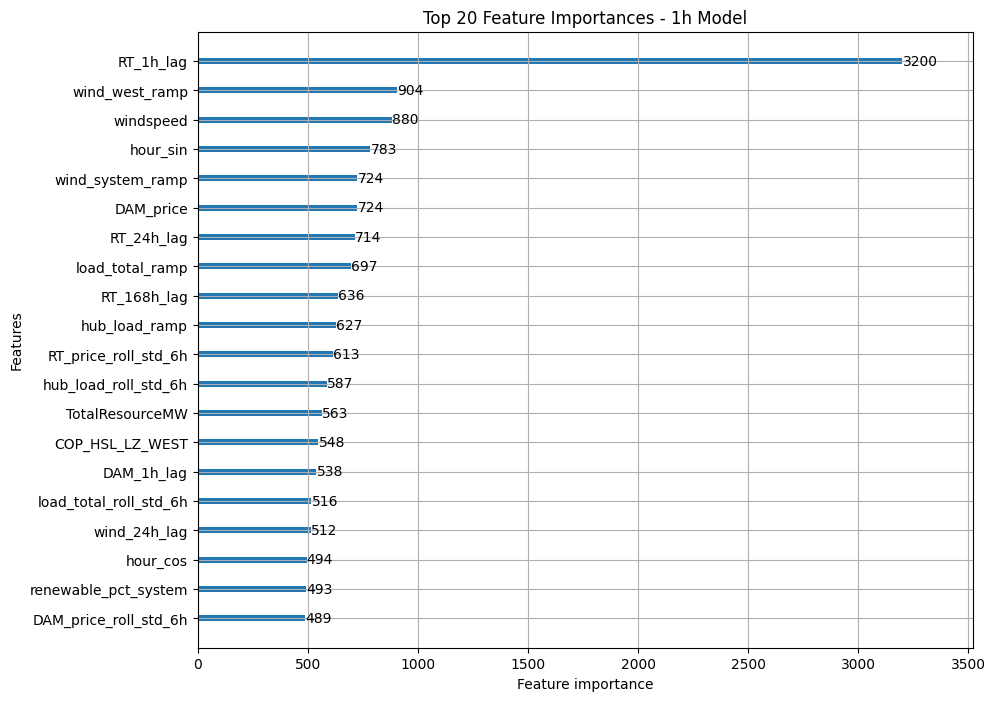

In [33]:
fig, ax = plt.subplots(figsize=(10, 8))
fig.patch.set_facecolor('white')
lgb.plot_importance(lgbm_no_uri, max_num_features=20, ax=ax)
ax.set_title('Top 20 Feature Importances - 1h Model')
plt.savefig(PROJECT_PATH + 'images/feature_importance_1h.png', bbox_inches='tight', dpi=150, facecolor='white')

In [17]:
train_no_uri_24h = train[~((train['timestamp'].dt.year == 2021) & (train['timestamp'].dt.month == 2))]
X_train_no_uri_24h = train_no_uri_24h.drop(columns=drop_24h)
y_train_no_uri_24h = train_no_uri_24h['regime']

lgbm_no_uri_24h = lgb.LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=5,
    num_leaves=63,
    class_weight='balanced',
    random_state=42,
    verbose=0
)
lgbm_no_uri_24h.fit(X_train_no_uri_24h, y_train_no_uri_24h)
print(classification_report(y_test_24h, lgbm_no_uri_24h.predict(X_test_24h)))

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [18]:
print(classification_report(y_test_24h, lgbm_no_uri_24h.predict(X_test_24h)))

              precision    recall  f1-score   support

         Low       0.53      0.78      0.63       644
      Normal       0.96      0.87      0.91      7559
    Scarcity       0.19      0.18      0.19        50
       Tight       0.36      0.65      0.46       505

    accuracy                           0.84      8758
   macro avg       0.51      0.62      0.55      8758
weighted avg       0.89      0.84      0.86      8758



## Check for Overfitting

F1 scores are very close in the 1 hour model and 24 hour model. Slight overfitting but acceptable.

In [19]:
# 1 hour model
from sklearn.metrics import f1_score
print('Train F1:', f1_score(y_train_no_uri, lgbm_no_uri.predict(X_train_no_uri), average='weighted'))
print('Test F1:', f1_score(y_test, lgbm_no_uri.predict(X_test), average='weighted'))

Train F1: 0.9395508304794103
Test F1: 0.9128693245836377


In [20]:
# 24 hour model
print('Train F1:', f1_score(y_train_24h, grid_24h.best_estimator_.predict(X_train_24h), average='weighted'))
print('Test F1:', f1_score(y_test_24h, grid_24h.best_estimator_.predict(X_test_24h), average='weighted'))

Train F1: 0.9083438061045147
Test F1: 0.8610821629374542


## Winning Models

1. **1h model (excl. Uri)** — F1: 0.91. Excluding Uri improved scarcity recall because the model stopped overfitting to extreme cold/outage patterns and learned more typical scarcity signals instead.

2. **24h model (incl. Uri)** — F1: 0.86. Top features shift from price momentum to fundamentals: wind forecast, DAM price, rolling stats, outages. Shift from technical to fundamental analysis at longer horizons.

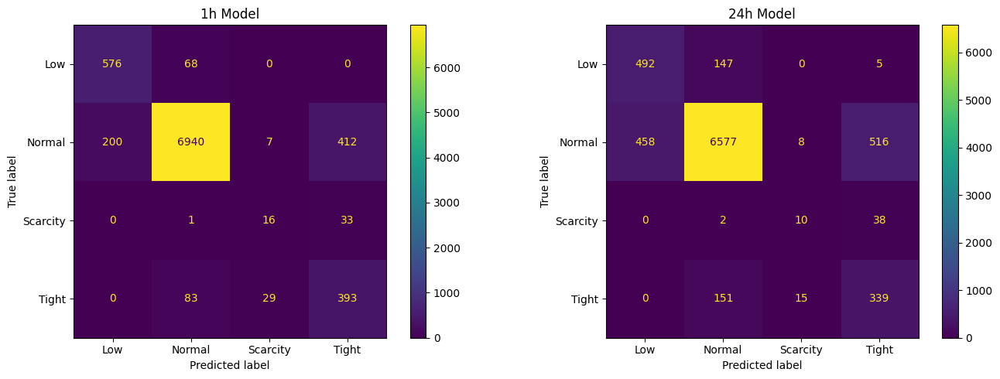

In [29]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.patch.set_facecolor('white')

ConfusionMatrixDisplay.from_estimator(lgbm_no_uri, X_test, y_test, ax=axes[0])
axes[0].set_title('1h Model')

ConfusionMatrixDisplay.from_estimator(grid_24h.best_estimator_, X_test_24h, y_test_24h, ax=axes[1])
axes[1].set_title('24h Model')

plt.tight_layout()
plt.savefig(PROJECT_PATH + 'images/confusion_matrices.png', bbox_inches='tight', dpi=150, facecolor='white')

In [22]:
# Save winning models

import joblib
os.makedirs(PROJECT_PATH + 'models/', exist_ok=True)

joblib.dump(lgbm_no_uri, PROJECT_PATH + "models/lgbm_1h_regime.pkl")
joblib.dump(grid_24h.best_estimator_, PROJECT_PATH + "models/lgbm_24h_regime.pkl")

['/Users/kamilmadey/Desktop/ercot_forecasting_project/models/lgbm_24h_regime.pkl']

## Observations

- LightGBM outperformed Logistic Regression and Random Forest across both models
- class_weight='balanced' significantly improved Tight and Scarcity recall by penalizing minority class misses
- Removing Winter Storm Uri from 1h training improved scarcity recall — extreme tail events added noise for typical scarcity patterns
- 1h model relies on price momentum (RT_1h_lag), 24h model shifts to fundamentals (wind forecast, DAM price) — a shift from technical to fundamental analysis at longer time horizons
- Most scarcity misses are labeled Tight, not Normal — model fails gracefully, still triggers load reduction
- Scarcity recall remains the biggest limitation (~0.20-0.32) due to only ~200 scarcity hours in 5 years. In production, supplement with ERCOT operational alerts as leading indicators
- Neither model shows significant overfitting (train vs test F1 gap low)

## Backtesting

In [23]:
#Mining backtest
import sys
sys.path.append(PROJECT_PATH + 'src/models/')
from decision_layer import mining_backtest, datacenter_backtest

predictions_1h = lgbm_no_uri.predict(X_test)
results = mining_backtest(test, predictions_1h)

Always-on cost: $57,687,748
Model-guided cost: $40,185,134
Savings: $17,502,614
Hours curtailed: 890 / 8758


In [24]:
# 24 hour
predictions_24h = grid_24h.best_estimator_.predict(X_test_24h)
results_24h = mining_backtest(test, predictions_24h)

Always-on cost: $57,687,748
Model-guided cost: $41,156,397
Savings: $16,531,351
Hours curtailed: 931 / 8758


In [26]:
#Datacenter backtest

results_dc_1h = datacenter_backtest(test, predictions_1h)
print("---------------")
results_dc_24h = datacenter_backtest(test, predictions_24h)

Always-on cost: $57,687,748
Model-guided cost: $54,207,381
Savings: $3,480,367
Hours at reduced load: 890 / 8758
---------------
Always-on cost: $57,687,748
Model-guided cost: $54,566,762
Savings: $3,120,985
Hours at reduced load: 931 / 8758
